## Image Captioning
- Generating Captions for Images

### Steps
- Data collection
- Understanding the data
- Data Cleaning
- Loading the training set
- Data Preprocessing — Images
- Data Preprocessing — Captions
- Data Preparation using Generator Function
- Word Embeddings
- Model Architecture
- Inference

In [ ]:
#Read Text Captions
def readTextFile(path):
    with open(path) as f:
        captions=f.read()
    return captions

In [ ]:
Captions=readTextFile("./Data/Flickr_TextData/Flickr8k.token.txt")
Captions=Captions.split("\n")
print(len(Captions))

40461


In [ ]:
Captions=Captions[:-1]

In [ ]:
# Dictionary to Map each Image with the list of captions it has

In [ ]:
descriptions={}

for x in Captions:
    first,second=x.split('\t')
    image_name=first.split('.')[0]
    #if the image id is already present or not
    if descriptions.get(image_name) is None:
        descriptions[image_name]=[]
    descriptions[image_name].append(second)
        
    

In [ ]:
descriptions["1000268201_693b08cb0e"]

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

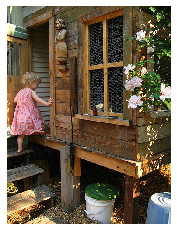

In [ ]:
IMG_PATH="Data/Images/"
import cv2
import matplotlib.pyplot as plt
image=cv2.imread(IMG_PATH+"1000268201_693b08cb0e.jpg")
#cv2 reads image in BGR format
image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
plt.axis("off")
plt.imshow(image)
plt.show()

### DATA CLEANING

In [ ]:
def clean_text(sentence):
    sentence=sentence.lower()
    sentence=re.sub("[^a-z]+"," ",sentence)
    sentence=sentence.split()
    sentence=[s for s in sentence if len(s)>1]
    sentence=" ".join(sentence)
    return sentence

In [ ]:
cleaned_text=clean_text("A cat is sitting over the house # 64")
print(cleaned_text)

cat is sitting over the house


In [ ]:
# Clean all Captions
for key,caption_list in descriptions.items():
    for i in range(len(caption_list)):
        caption_list[i]=clean_text(caption_list[i])

In [ ]:
descriptions["1000268201_693b08cb0e"]

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

In [ ]:
with open("descriptions.txt",'w') as f:
    f.write(str(descriptions))

### VOCABULARY

In [ ]:
descriptions=None
with open("descriptions.txt",'r') as f:
    descriptions=f.read()
    json_acceptable_string=descriptions.replace("'","\"")
    descriptions=json.loads(json_acceptable_string)
    print(type(descriptions))

<class 'dict'>


In [ ]:
#Vocab
vocab=set()#Set() stores all the unique words
for key in descriptions.keys():
    [vocab.update(sentence.split()) for sentence in descriptions[key]]
print("Vocab Size :%d"%len(vocab))

Vocab Size :8424


In [ ]:
#Total number of words across all the sentences.
total_words=[]
for key in descriptions.keys():
    [total_words.append(i) for des in descriptions[key] for i in des.split()]
print("Total Words %d"%len(total_words))

Total Words 373837


In [ ]:
# Filter Words from the Vocab according to certain threshold frequncy
import collections
counter=collections.Counter(total_words)
Frequency_count=dict(counter)
print(len(Frequency_count.keys()))

8424


In [ ]:
# Sort this dictionary according to the freq count
sorted_frequency_count=sorted(Frequency_count.items(),reverse=True,key=lambda x:x[1]) 
#Filter
threshold=10
sorted_frequency_count=[x for x in sorted_frequency_count if x[1]>threshold]
total_words=[x[0] for x in sorted_frequency_count]

In [ ]:

print(len(total_words))

1845


### PREPARE TRAIN/TEST SPLIT

In [ ]:
Train_File_data=readTextFile("Data/Flickr_TextData/Flickr_8k.trainImages.txt")
Test_File_data=readTextFile("Data/Flickr_TextData/Flickr_8k.testImages.txt")

In [ ]:
train=[row.split(".")[0] for row in Train_File_data.split("\n")][:-1]

In [ ]:
test=[row.split(".")[0] for row in Test_File_data.split("\n")[:-1]]

In [ ]:
train[:5]

['2513260012_03d33305cf',
 '2903617548_d3e38d7f88',
 '3338291921_fe7ae0c8f8',
 '488416045_1c6d903fe0',
 '2644326817_8f45080b87']

In [ ]:
# Prepare Description for the Training Data
# Tweak - Add <s> and <e> token to our training data
train_descriptions={}
for image_id in train:
    train_descriptions[image_id]=[]
    for caption1 in descriptions[image_id]:
        caption_to_append="startseq "+caption1+" endseq"
        train_descriptions[image_id].append(caption_to_append)
        

In [ ]:
train_descriptions["1000268201_693b08cb0e"]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

### Transfer Learning
- Images --> Features
- Text ---> Features

### Step - 1 Image Feature Extraction

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras
import re
import nltk
from nltk.corpus import stopwords
import string
import json
from time import time
import pickle
from keras.applications.vgg16 import VGG16
from keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from keras.preprocessing import image
from keras.models import Model, load_model
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.layers import Input, Dense, Dropout, Embedding, LSTM
from keras.layers.merge import add
#This cell must be executed before  all below cells else output will come.

In [ ]:
model=ResNet50(weights='imagenet',input_shape=(224,224,3))
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
___________________________________________________________________________________________

In [ ]:
model_new=Model(model.input,model.layers[-2].output)

In [ ]:
def preprocess_img(img):
    img=image.load_img(img,target_size=(224,224))
    img=image.img_to_array(img)
    img=np.expand_dims(img,axis=0)
    
    # Normalization
    img=preprocess_input(img)
    return img

In [ ]:
def encode_image(img):
    img=preprocess_img(img)
    feature_vector=model_new.predict(img)
    #print(feature_vector.shape)
    feature_vector=feature_vector.reshape((-1,))
    #print(feature_vector.shape)
    return feature_vector
    

In [ ]:
encode_image(IMG_PATH+"1000268201_693b08cb0e.jpg")

array([0.04154472, 0.17075916, 0.29276797, ..., 0.05094022, 0.3131962 ,
       0.8600728 ], dtype=float32)

In [ ]:
encoding_train={}
start_time=time()
for ix,img_id in enumerate(train):
    img_path=IMG_PATH+"/"+img_id+".jpg"
    encoding_train[img_id]=encode_image(img_path)
    if ix%100==0:
        print("Encoding in Progress Time Step %d"%ix)
end_time=time()
print("Total Time taken :",(end_time-start_time))


Encoding in Progress Time Step 0
Encoding in Progress Time Step 100
Encoding in Progress Time Step 200
Encoding in Progress Time Step 300
Encoding in Progress Time Step 400
Encoding in Progress Time Step 500
Encoding in Progress Time Step 600
Encoding in Progress Time Step 700
Encoding in Progress Time Step 800
Encoding in Progress Time Step 900
Encoding in Progress Time Step 1000
Encoding in Progress Time Step 1100
Encoding in Progress Time Step 1200
Encoding in Progress Time Step 1300
Encoding in Progress Time Step 1400
Encoding in Progress Time Step 1500
Encoding in Progress Time Step 1600
Encoding in Progress Time Step 1700
Encoding in Progress Time Step 1800
Encoding in Progress Time Step 1900
Encoding in Progress Time Step 2000
Encoding in Progress Time Step 2100
Encoding in Progress Time Step 2200
Encoding in Progress Time Step 2300
Encoding in Progress Time Step 2400
Encoding in Progress Time Step 2500
Encoding in Progress Time Step 2600
Encoding in Progress Time Step 2700
Enco

In [ ]:
!mkdir saved

In [ ]:
with open("encoded_train_features.pkl",'wb') as f:
    pickle.dump(encoding_train,f)

print(len(encoding_train))

6000


In [ ]:
encoding_test={}
start_time=time()
for ix,img_id in enumerate(test):
    img_path=IMG_PATH+"/"+img_id+".jpg"
    encoding_test[img_id]=encode_image(img_path)
    if ix%100==0:
        print("Encoding in Progress Time Step %d"%ix)
end_time=time()
print("Total Time taken :",(end_time-start_time))

Encoding in Progress Time Step 0
Encoding in Progress Time Step 100
Encoding in Progress Time Step 200
Encoding in Progress Time Step 300
Encoding in Progress Time Step 400
Encoding in Progress Time Step 500
Encoding in Progress Time Step 600
Encoding in Progress Time Step 700
Encoding in Progress Time Step 800
Encoding in Progress Time Step 900
Total Time taken : 265.48324179649353


In [ ]:
with open("saved/encoded_test_features.pkl",'wb') as f:
    pickle.dump(encoding_test,f)

print(len(encoding_test))

1000


### Data Pre-processing for captions

In [ ]:
word_to_index={}
index_to_word={}
for i,word in enumerate(total_words):
    word_to_index[word]=i+1
    index_to_word[i+1]=word

In [ ]:
word_to_index["startseq"]=1846
word_to_index["endseq"]=1847
index_to_word[1846]="staetseq"
index_to_word[1847]="endseq"

In [ ]:
print(len(word_to_index))

1847


In [ ]:
vocab_size=len(word_to_index)+1
print("Vocab_Size : ",vocab_size)

Vocab_Size :  1848


In [ ]:
max_len=0
for key in train_descriptions.keys():
    for caption in train_descriptions[key]:
        max_len=max(max_len,len(caption.split()))
print(max_len)

35


### DATA LOADER/GENERATOR

In [ ]:
def data_generator(train_descriptions,encoding_train,word_to_index,max_len,batch_size):
    X1,X2,y=[],[],[]
    n=0
    while True:
        for key,caption_list in train_descriptions.items():
            n+=1
            photo=encoding_train[key]
            for caption in caption_list:
                sequence=[word_to_index[word] for word in caption.split() if word in word_to_index]
                 
                for i in range(1,len(sequence)):
                    xi=sequence[0:i]
                    yi=sequence[i]
                
                    xi=pad_sequences([xi],maxlen=max_len,value=0,padding='post')[0]
                    yi=to_categorical([yi],num_classes=vocab_size)[0]

                    X1.append(photo)
                    X2.append(xi)
                    y.append(yi)
                    if n==batch_size:
                        yield[[np.array(X1),np.array(X2)],np.array(y)]
                        X1,X2,y=[],[],[]
                        n=0

### WORD EMBEDDINGS

In [ ]:
f=open("./saved/glove.6B.50d.txt",encoding='utf-8')
for line in f:
    values=line.split()
    print(values)
    break

['the', '0.418', '0.24968', '-0.41242', '0.1217', '0.34527', '-0.044457', '-0.49688', '-0.17862', '-0.00066023', '-0.6566', '0.27843', '-0.14767', '-0.55677', '0.14658', '-0.0095095', '0.011658', '0.10204', '-0.12792', '-0.8443', '-0.12181', '-0.016801', '-0.33279', '-0.1552', '-0.23131', '-0.19181', '-1.8823', '-0.76746', '0.099051', '-0.42125', '-0.19526', '4.0071', '-0.18594', '-0.52287', '-0.31681', '0.00059213', '0.0074449', '0.17778', '-0.15897', '0.012041', '-0.054223', '-0.29871', '-0.15749', '-0.34758', '-0.045637', '-0.44251', '0.18785', '0.0027849', '-0.18411', '-0.11514', '-0.78581']


In [ ]:
embedding_index={}
for line in f:
    values=line.split()
    word=values[0]
    word_embedding=np.array(values[1:],dtype='float')
    embedding_index[word]=word_embedding

f.close()

In [ ]:
embedding_index["dog"]

array([ 0.11008  , -0.38781  , -0.57615  , -0.27714  ,  0.70521  ,
        0.53994  , -1.0786   , -0.40146  ,  1.1504   , -0.5678   ,
        0.0038977,  0.52878  ,  0.64561  ,  0.47262  ,  0.48549  ,
       -0.18407  ,  0.1801   ,  0.91397  , -1.1979   , -0.5778   ,
       -0.37985  ,  0.33606  ,  0.772    ,  0.75555  ,  0.45506  ,
       -1.7671   , -1.0503   ,  0.42566  ,  0.41893  , -0.68327  ,
        1.5673   ,  0.27685  , -0.61708  ,  0.64638  , -0.076996 ,
        0.37118  ,  0.1308   , -0.45137  ,  0.25398  , -0.74392  ,
       -0.086199 ,  0.24068  , -0.64819  ,  0.83549  ,  1.2502   ,
       -0.51379  ,  0.04224  , -0.88118  ,  0.7158   ,  0.38519  ])

In [ ]:
def get_embedding_matrix():
    embedding_dimension=50
    Matrix=np.zeros((vocab_size,embedding_dimension))
    for word,index in word_to_index.items():
        embedding_vector=embedding_index.get(word)
        if embedding_vector is not None:
            Matrix[index]=embedding_vector
    return Matrix
        

In [ ]:
embedding_matrix=get_embedding_matrix()
print(type(embedding_matrix))

<class 'numpy.ndarray'>


In [ ]:
print(embedding_matrix[8])
print(embedding_matrix.shape)

[-0.094386  0.43007  -0.17224  -0.45529   1.6447    0.40335  -0.37263
  0.25071  -0.10588   0.10778  -0.10848   0.15181  -0.65396   0.55054
  0.59591  -0.46278   0.11847   0.64448  -0.70948   0.23947  -0.82905
  1.272     0.033021  0.2935    0.3911   -2.8094   -0.70745   0.4106
  0.3894   -0.2913    2.6124   -0.34576  -0.16832   0.25154   0.31216
  0.31639   0.12539  -0.012646  0.22297  -0.56585  -0.086264  0.62549
 -0.0576    0.29375   0.66005  -0.53115  -0.48233  -0.97925   0.53135
 -0.11725 ]
(1848, 50)


### MODEL ARCHITECTURE

In [ ]:
input_img_features=Input(shape=(2048,))
input_img1=Dropout(0.3)(input_img_features)
input_img2=Dense(256,activation='relu')(input_img1)

In [ ]:
# Captions as Input
input_captions=Input(shape=(max_len,))
input_caption1=Embedding(input_dim=vocab_size,output_dim=50,mask_zero=True)(input_captions)
input_caption2=Dropout(0.5)(input_caption1)
input_caption3=LSTM(256)(input_caption2)

In [ ]:
decoder1=add([input_img2,input_caption3]) 
decoder2=Dense(256,activation='relu')(decoder1)
outputs=Dense(vocab_size,activation='softmax')(decoder2)
# Combined Model
model=Model(inputs=[input_img_features,input_captions],outputs=outputs)

In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 35)           0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 2048)         0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 35, 50)       92400       input_3[0][0]                    
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 2048)         0           input_2[0][0]                    
____________________________________________________________________________________________

In [ ]:
# Important Thing - Embedding Layer
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable=False

In [ ]:
model.compile(loss='categorical_crossentropy',optimizer='adam')

### TRAINING OF MODEL

In [ ]:
!mkdir model_weights

In [ ]:
epochs=20
number_pics_per_batch=3
steps=len(train_descriptions)//number_pics_per_batch

In [ ]:
def train_model():
    for i in range(epochs):
        generator=data_generator(train_descriptions,encoding_train,word_to_index,max_len,number_pics_per_batch)
        model.fit_generator(generator,epochs=1,steps_per_epoch=steps,verbose=1)
        model.save('./model_weights/model_'+str(i)+'.h5')

In [ ]:
train_model()

Epoch 1/1
2000/2000 [==============================] - 647s 323ms/step - loss: 4.3795
Epoch 1/1
2000/2000 [==============================] - 366s 183ms/step - loss: 3.6878s - los
Epoch 1/1
2000/2000 [==============================] - 369s 185ms/step - loss: 3.4395
Epoch 1/1
2000/2000 [==============================] - 380s 190ms/step - loss: 3.2896
Epoch 1/1
2000/2000 [==============================] - 377s 188ms/step - loss: 3.1816
Epoch 1/1
2000/2000 [==============================] - 377s 189ms/step - loss: 3.1016
Epoch 1/1
2000/2000 [==============================] - 376s 188ms/step - loss: 3.0363
Epoch 1/1
2000/2000 [==============================] - 375s 188ms/step - loss: 2.9828
Epoch 1/1
2000/2000 [==============================] - 374s 187ms/step - loss: 2.9445
Epoch 1/1
2000/2000 [==============================] - 795s 398ms/step - loss: 2.9056
Epoch 1/1
2000/2000 [==============================] - 393s 196ms/step - loss: 2.8739
Epoch 1/1
2000/2000 [==========================

In [ ]:
model=load_model('./model_weights/model_9.h5')#These are the model weights after 10 epoch.

### PREDICTIONS

In [ ]:
def predict_caption(photo):
    in_text="startseq"
    for i in range(max_len):
        sequence=[word_to_index[w] for w in in_text.split() if w in word_to_index]
        sequence=pad_sequences([sequence],maxlen=max_len,padding='post')
        y_predicted=model.predict([photo,sequence])
        y_predicted=y_predicted.argmax()#Word with max prob always - Greedy Sampling
        word=index_to_word[y_predicted]
        in_text+=(' '+word)
        if word=='endseq':
            break
        final_caption=in_text.split()[1:-1]
        final_caption=' '.join(final_caption)
    return final_caption

two men in black shirts are standing in front of brick


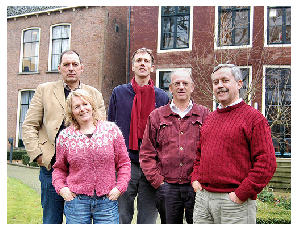

the dog is leaping into the


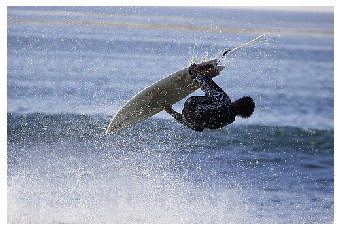

two men in dresses are standing in front of


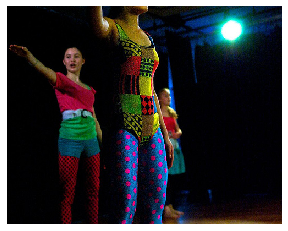

little girl in pink dress is swinging on


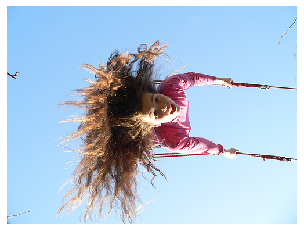

dog is running through the


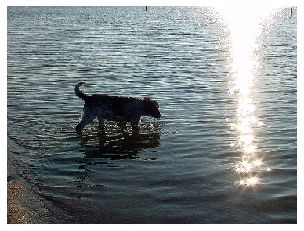

little girl in red shirt and white shirt is standing on the floor of the


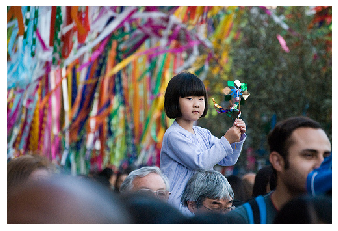

boy in blue shirt and jeans is jumping on


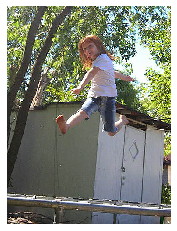

skateboarder does trick on


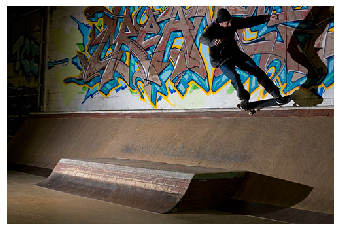

black and white dog is running through the


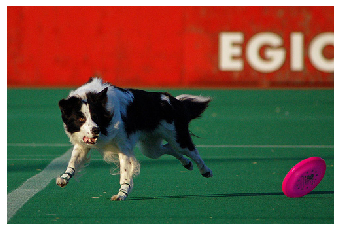

little boy is licking in the


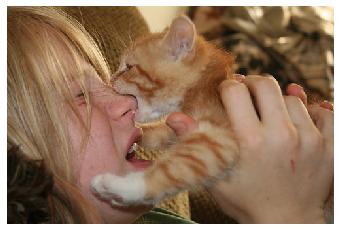

two dogs are playing in the


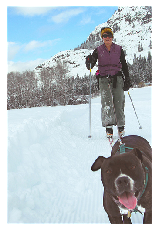

two girls are standing in front of the


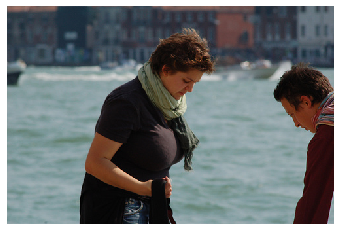

the boys are playing soccer on the


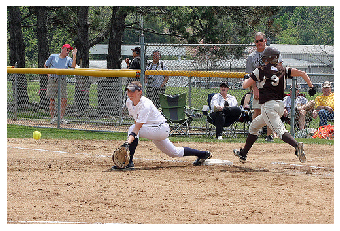

boy in black shirt is jumping into the


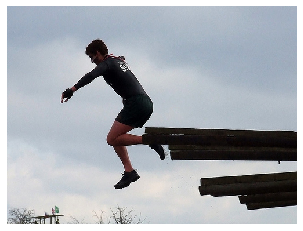

race car is taking the


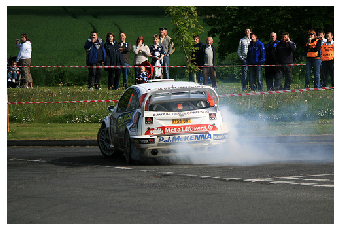

two dogs are running through


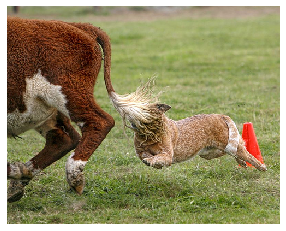

man in black shirt is playing with his


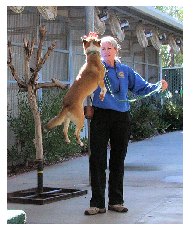

two men are playing


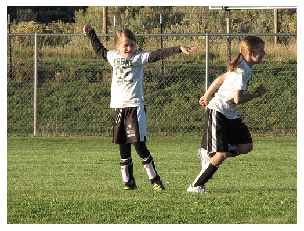

two dogs are running through field of


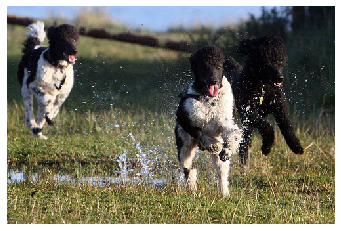

surfer is riding


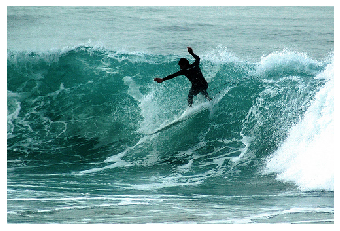

little girl in red shirt and white shirt is holding onto the


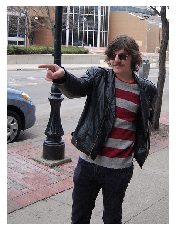

little girl in red shirt is eating on the floor of large


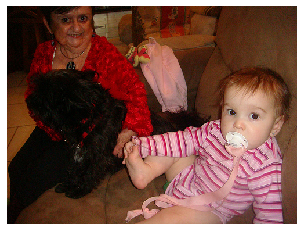

brown dog jumping over


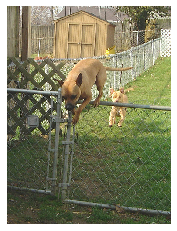

group of people are standing on the


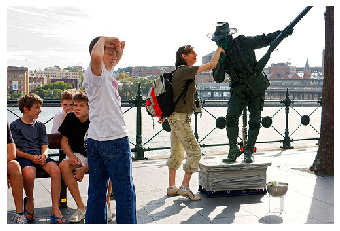

brown and white dog is running through the


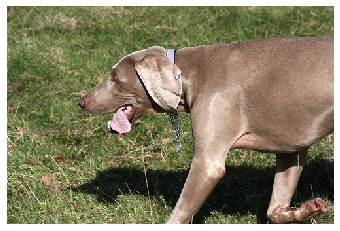

man in black shirt and black shirt is sitting on bench with her


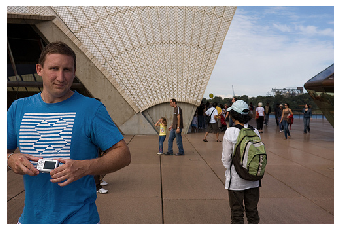

two men in karate arts


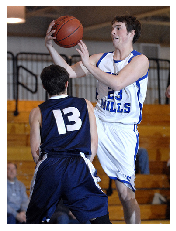

little girl in yellow shirt is playing on the


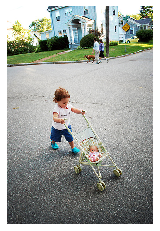

two girls in black dresses are standing in front of an style


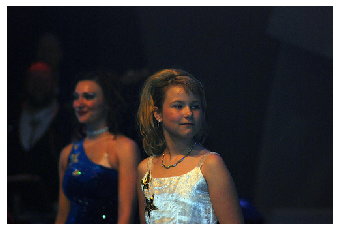

man in blue shirt and jeans is riding bicycle on the


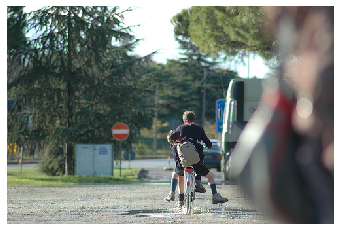

little girl in red shirt is playing with basketball


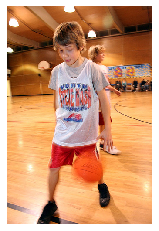

dog is running through the


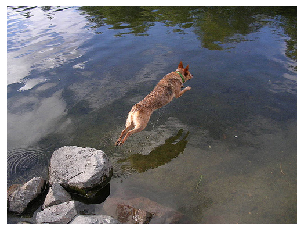

man in black shirt and black shirt is standing on


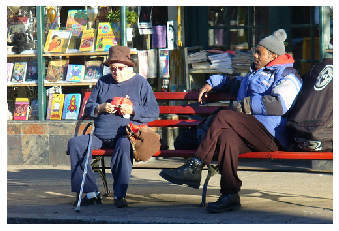

little boy in red shirt is playing


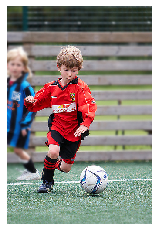

two men are jumping over the


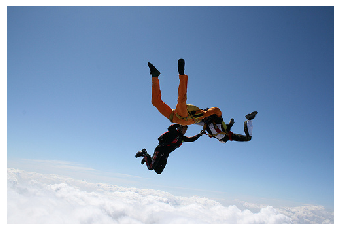

woman in black shirt and black shirt stands in front of brick


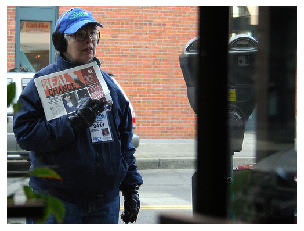

dog running on


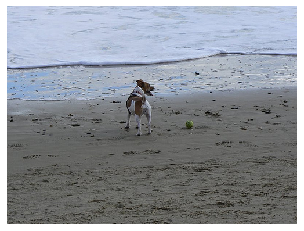

boy is jumping on swing


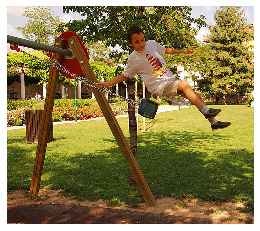

two men in karate arts


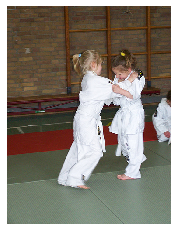

woman in black shirt and black hat is standing in front of crowd of


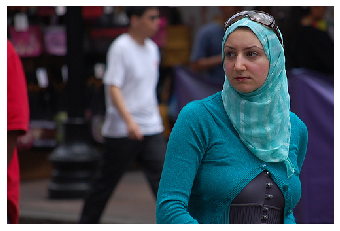

climber scales rock


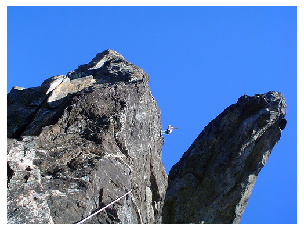

man in red shirt and white shirt is holding up her head in front of


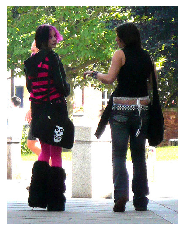

dog is running on


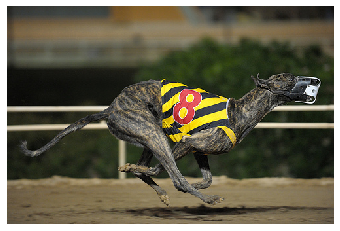

woman in headscarf and white shirt is holding baby in front of crowd of


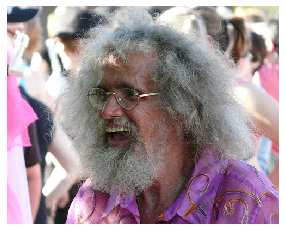

little boy is sitting on bed with


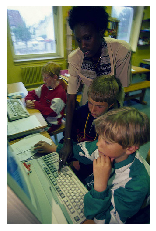

black dog is running through the


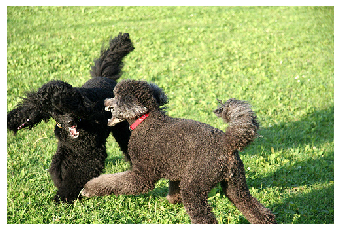

dog is running through the


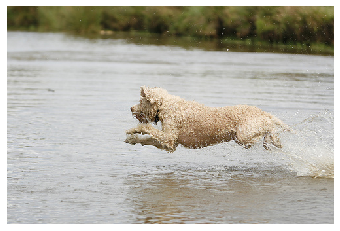

two dogs are playing with toy in the


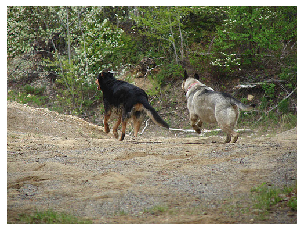

group of people are walking down


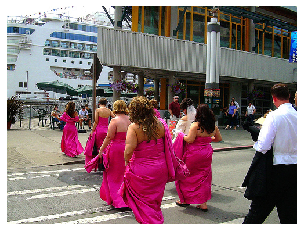

two dogs are playing with


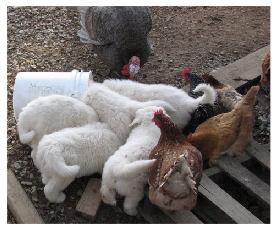

woman in jeans is standing on the street in front of large


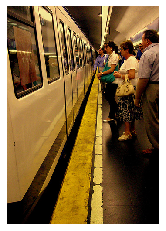

little girl in pink dress is swinging on


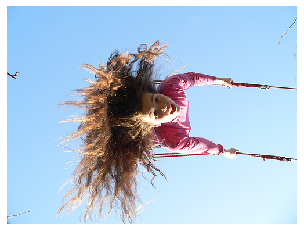

football player in red strip the player in white


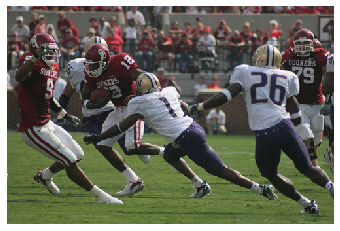

group of people in skimpy suits are standing on the


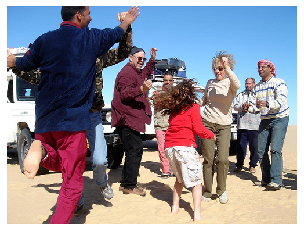

dog is jumping over


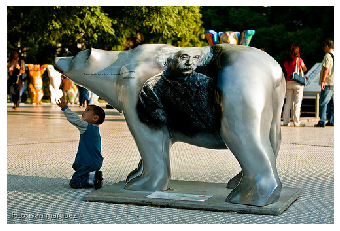

two men are jumping over the


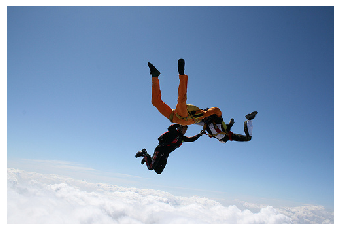

little girl in blue bathing suit is running on the


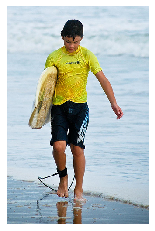

man in black shirt and black shirt is standing next to man in black


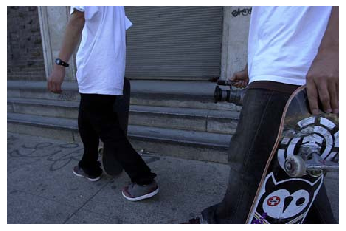

boy in blue shirt and blue shirt is swinging on


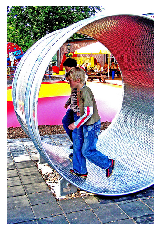

little girl in red shirt is playing with


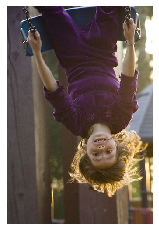

young boy in blue bathing suit is playing in


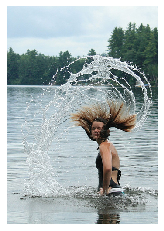

two dogs are running through the


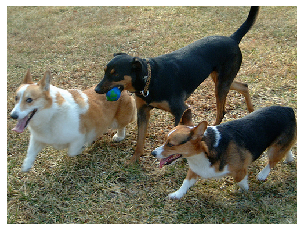

young girl in black shirt and black jacket is standing in the


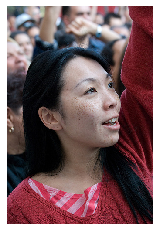

child in red of child in red


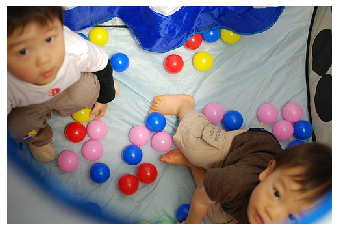

man sings guitar guitar guitar guitar guitar guitar guitar guitar guitar


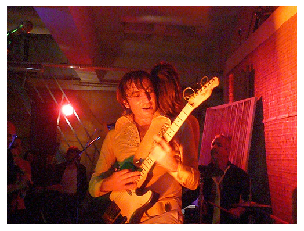

little boy in red shirt is playing with


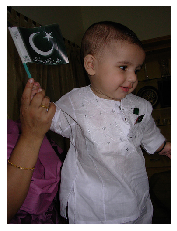

black dog jumps over


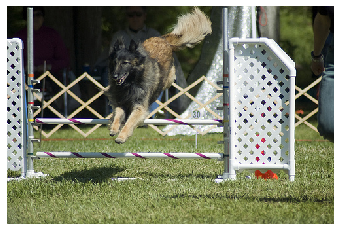

dog jumping over


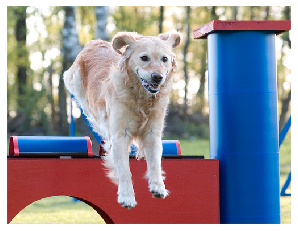

black and white dog is running through


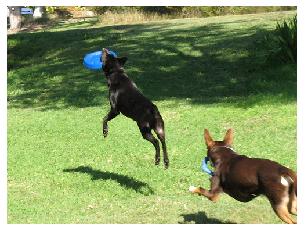

man in blue shirt and blue shirt is riding bicycle on dirt


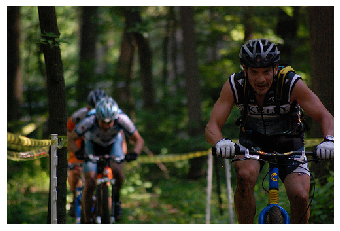

group of women in black dresses and black


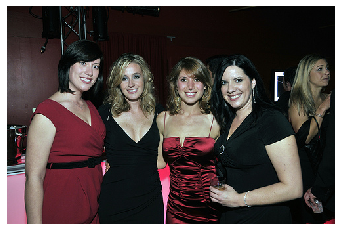

man in black shirt and jeans is standing on the


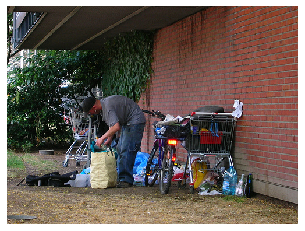

team game in the


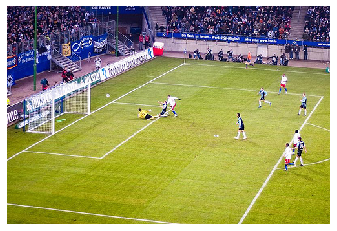

two girls in crowd of


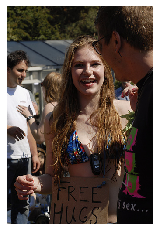

group of people are standing on the


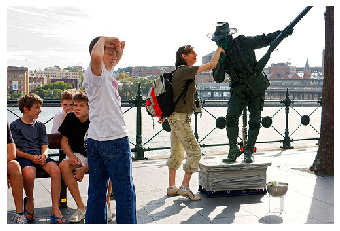

two dogs are playing with toy in the


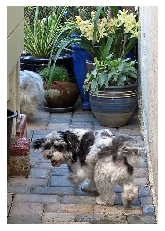

little girl in white shirt and white shirt is playing with the


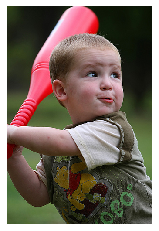

man in red kayak is riding through the


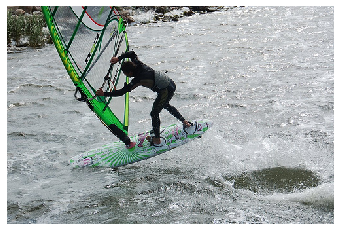

two dogs are running through


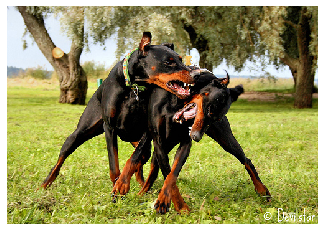

man in red coat is sitting on the top of


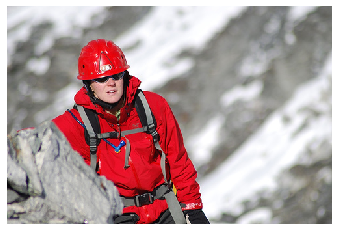

little boy in pajamas is playing with


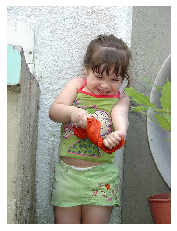

boy in green shirt is jumping on the air on


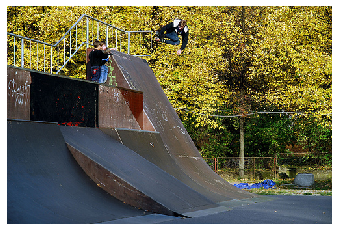

man in swim trunks is jumping into the


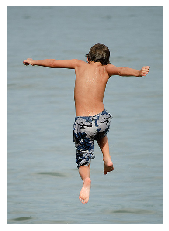

two girls are standing in front of the


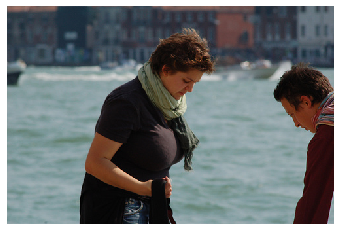

group of people are walking down


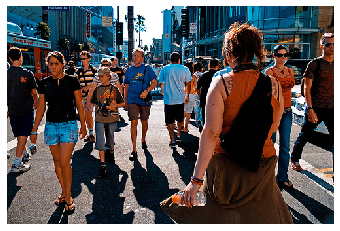

two men in white jerseys are riding


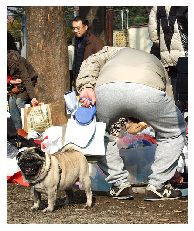

man on motorcycle is riding his bike on the


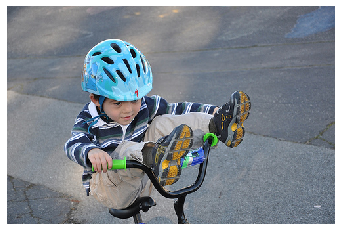

two children are playing with


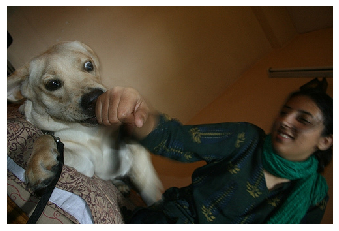

man on bike is doing stunt on


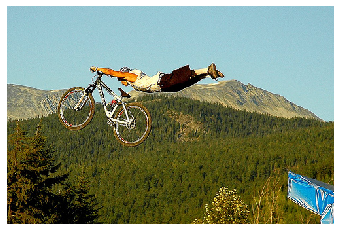

white dog is running on the


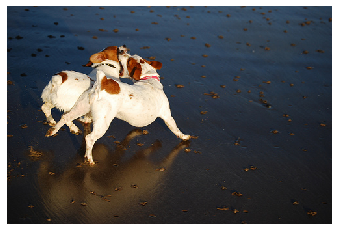

dog runs through the


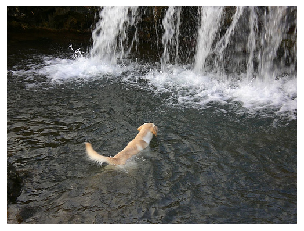

two girls are sitting in the


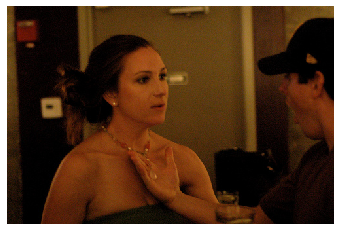

man in black shirt and white shirt is jumping up of the


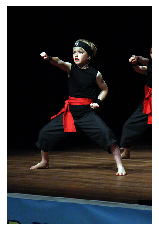

man in red shirt and helmet is riding his bike on dirt


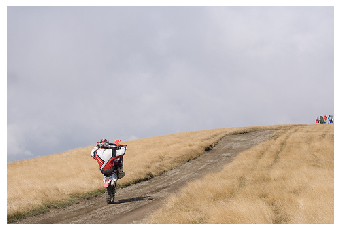

boy in red shirt and blue pants is playing with


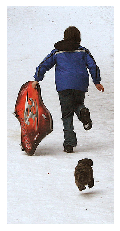

In [ ]:
# Pick Some Random Images and See Results
for i in range(95):
    index=np.random.randint(0,1000)
    all_image_names=list(encoding_test.keys())
    image_name=all_image_names[index]
    photo_2048=encoding_test[image_name].reshape((1,2048))
    #Because,To our model ,we are feeding Batch_size cross 2048,(It has two axes).
    #We are generating predictions for one image at a time.
    i=plt.imread(IMG_PATH+image_name+".jpg")
    caption=predict_caption(photo_2048)
    print(caption)
    plt.axis("off")
    plt.imshow(i)
    plt.show()